### Data Pre-Processing

##### Import Packages and CSV

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.pandas.set_option("display.max_columns", None)

- Load data

In [2]:
df = pd.read_csv('../data/final_scout_not_dummy.csv')

- Preview data shape

In [3]:
df.shape

(15915, 23)

### Data Cleaning

#### Handling Missing values

* Handling Missing values 
* Handling Duplicates
* Check data type
* Understand the dataset

Checking missing value

In [4]:
# these are the features with nan value
features_with_na=[features for features in df.columns if df[features].isnull().sum()>=1]
for feature in features_with_na:
    print(feature,np.round(df[feature].isnull().mean()*100,5), '% missing values')

In [5]:
features_with_na

[]

- There is no missing value the dataset

Handling the Duplicates values

In [6]:
df.duplicated().sum()

1673

- There are 1673 duplicate value

Dropping duplicate data

In [7]:
# Drop duplicate rows
df_cleaned = df.drop_duplicates()
print(f"Dataset shape after removing duplicates: {df_cleaned.shape}")

Dataset shape after removing duplicates: (14242, 23)


Checking Data type

In [8]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14242 entries, 0 to 15912
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   make_model           14242 non-null  object 
 1   body_type            14242 non-null  object 
 2   price                14242 non-null  int64  
 3   vat                  14242 non-null  object 
 4   km                   14242 non-null  float64
 5   Type                 14242 non-null  object 
 6   Fuel                 14242 non-null  object 
 7   Gears                14242 non-null  float64
 8   Comfort_Convenience  14242 non-null  object 
 9   Entertainment_Media  14242 non-null  object 
 10  Extras               14242 non-null  object 
 11  Safety_Security      14242 non-null  object 
 12  age                  14242 non-null  float64
 13  Previous_Owners      14242 non-null  float64
 14  hp_kW                14242 non-null  float64
 15  Inspection_new       14242 non-null  int6

### Understanding the data

#### Type of Features

- Numeric Features

In [9]:
num_features = [feature for feature in df.columns if df[feature].dtype != 'O']
print('Num of Numerical Features :', len(num_features))

Num of Numerical Features : 10


- Categorical Feature

In [10]:
cat_features = [feature for feature in df.columns if df[feature].dtype == 'O']
print('Num of Categorical Features :', len(cat_features))

Num of Categorical Features : 13


Discrete features

In [11]:
discrete_features=[feature for feature in num_features if len(df[feature].unique())<=25]
print('Num of Discrete Features :',len(discrete_features))

Num of Discrete Features : 4


In [12]:
discrete_features

['Gears', 'age', 'Previous_Owners', 'Inspection_new']

In [13]:
# Check the number of unique values in each of the four columns
for column in discrete_features:  
    print(f"{column} has {len(df[column].unique())} unique values.")

Gears has 4 unique values.
age has 4 unique values.
Previous_Owners has 5 unique values.
Inspection_new has 2 unique values.


In [14]:
for i in discrete_features:
    print(df_cleaned[i].unique())

[7. 6. 5. 8.]
[3. 2. 1. 0.]
[2. 1. 0. 3. 4.]
[1 0]


Insight
- From the list only the Inspection_new can be coverted to caterical which already are:

#### Split X and Y

* **Split Dataframe to X and y**
* **Here we set a variable X i.e, independent columns, and a variable y i.e, dependent column as the “price” column.**

In [15]:
X = df_cleaned.drop('price', axis=1)
y = df_cleaned['price']

In [16]:
y.head()

0    15770
1    14500
2    14640
3    14500
4    16790
Name: price, dtype: int64

### Feature Transformation

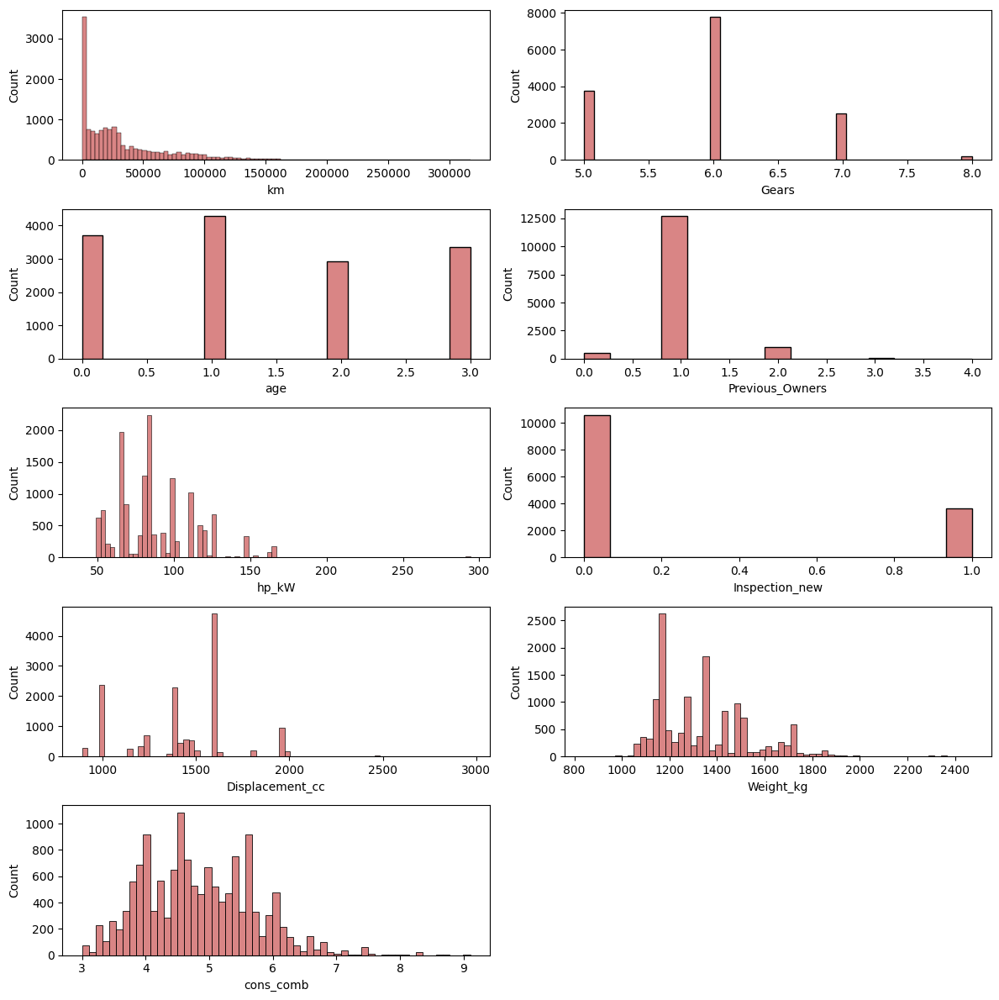

In [17]:
# Get the numeric columns in the dataset
numeric_cols = X.select_dtypes(include=['float64', 'int64']).columns

# Set the number of rows and columns dynamically based on the number of numeric columns
num_cols = len(numeric_cols)
num_rows = (num_cols // 2) + (num_cols % 2)  # This ensures enough rows for odd numbers of columns

# Set the plot size and create the subplots
plt.figure(figsize=(12, 12))
for i, col in enumerate(numeric_cols):
    plt.subplot(num_rows, 2, i+1)  # Adjust the number of rows and columns
    sns.histplot(x=X[col], color='indianred')
    plt.xlabel(col)
    plt.tight_layout()

plt.show()


**Checking Skewness**

In [18]:
# Check Skewness
X[numeric_cols].skew(axis=0, skipna=True)

km                 1.651559
Gears              0.330928
age                0.160196
Previous_Owners    1.103556
hp_kW              1.329722
Inspection_new     1.116593
Displacement_cc   -0.075773
Weight_kg          1.068812
cons_comb          0.457589
dtype: float64

- Positiviely Skewed : km, Previous_Owners, hp_kW, Inspection_new, and Weight_kg.
- We can handle outliers and then check the skewness.

### Apply Power Transformer to Check if it can reduces the outliers

In [19]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')
transform_features = ['km', 'Previous_Owners','hp_kW','Weight_kg']
X_copy = pt.fit_transform(X[transform_features])

In [20]:
X_copy = pd.DataFrame(X_copy, columns=transform_features)

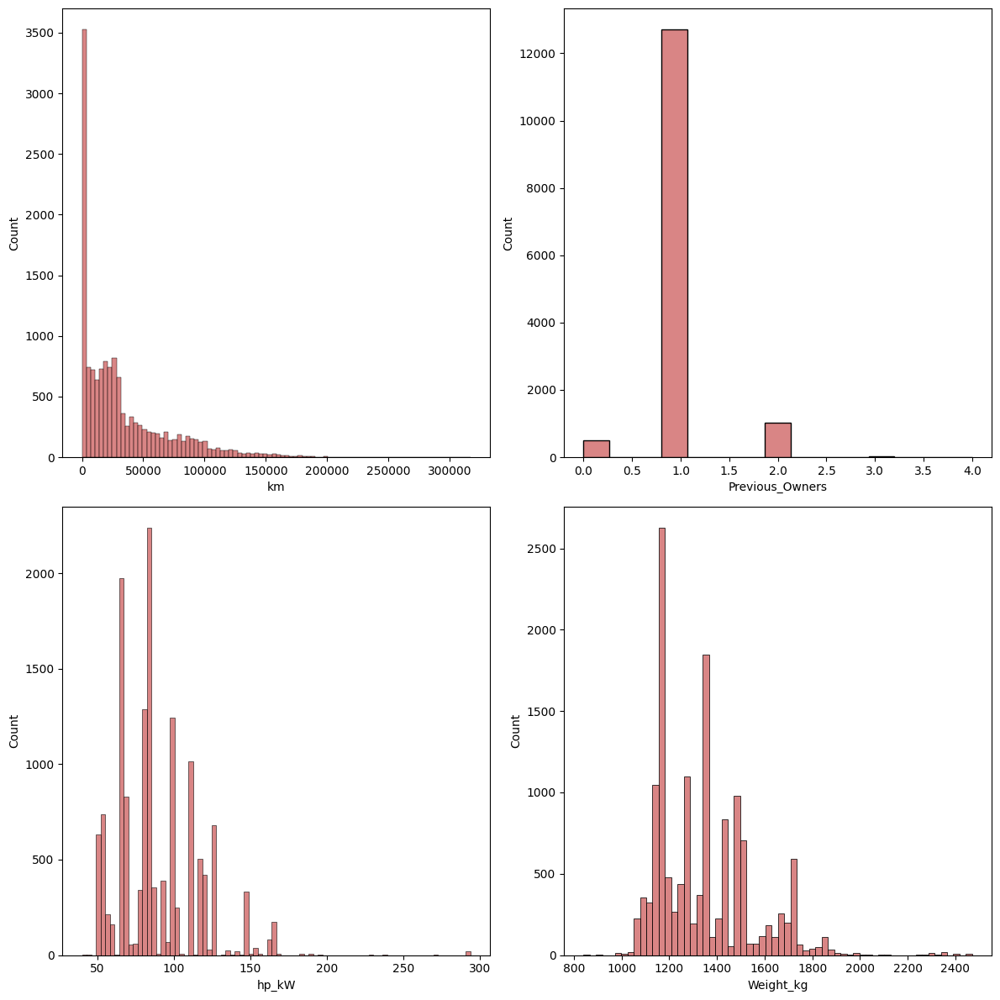

In [21]:
# Set the number of rows and columns dynamically based on the number of numeric columns
num_cols = len(transform_features)
num_rows = (num_cols // 2) + (num_cols % 2)  # This ensures enough rows for odd numbers of columns

# Set the plot size and create the subplots
plt.figure(figsize=(12, 12))
for i, col in enumerate(transform_features):
    plt.subplot(num_rows, 2, i+1)  # Adjust the number of rows and columns
    sns.histplot(x=X[col], color='indianred')
    plt.xlabel(col)
    plt.tight_layout()

plt.show()

In [22]:
X_copy.skew(axis=0, skipna=True)

km                -0.334641
Previous_Owners    0.270234
hp_kW              0.010744
Weight_kg          0.082173
dtype: float64

- Here Inspection_new column is binary categorical feature

In [23]:
for feature in cat_features:
    print(feature,':', df[feature].nunique())

make_model : 9
body_type : 8
vat : 2
Type : 5
Fuel : 4
Comfort_Convenience : 6196
Entertainment_Media : 346
Extras : 659
Safety_Security : 4442
Paint_Type : 3
Upholstery_type : 2
Gearing_Type : 3
Drive_chain : 3


### Feature Encoding and Scaling

 **One Hot Encoding for Columns which had lesser unique values and not ordinal**
* One hot encoding is a process by which categorical variables are converted into a form that could be provided to ML algorithms to do a better job in prediction.

**Label Encoding**
- Definition: Assigns a unique integer to each category of a feature, without implying any order or hierarchy between the categories.

- Use Case: Suitable for nominal data, where categories do not have any inherent order (e.g., ["Red", "Blue", "Green"]).

**Ordinal Encoding for Columns which has many unique categories** 
* Ordinal encoding is used here as label encoder is supported for column transformer.
* Ordinal encoding is used for Ordinal Variable. Variable comprises a finite set of discrete values with a ranked ordering between values.

**Standard Scaler** 
* Standardize features by removing the mean and scaling to unit variance.

**Power Transformer**
* Power transforms are a technique for transforming numerical input or output variables to have a Gaussian or more-Gaussian-like probability distribution.

**Selecting number features for preprocessing**

In [24]:
num_features = list(X.select_dtypes(exclude="object").columns)

### **Preprocessing using Column Transformer**

- Performing Ordinal encoding on categorical features that are binary i.e having two unique value
- Performing Label Encoding on the categorical feature that have high unique values i.e high cardinality
 - Performing OneHot encoding on the categorical feature that have less unique values
 - Power transformer to normalize feature from skewness

In [25]:
from sklearn.preprocessing import LabelEncoder

# Define columns to be encoded
le_columns = ['Comfort_Convenience', 'Entertainment_Media', 'Extras', 'Safety_Security']

# Create a copy of the DataFrame to avoid modifying the original
df_label_encoded = X.copy()

# Initialize LabelEncoder
le = LabelEncoder()

# Apply LabelEncoder to each specified column
for col in le_columns:
    df_label_encoded[col] = le.fit_transform(df_label_encoded[col])

# Check the transformed DataFrame
print(df_label_encoded[le_columns].head())

   Comfort_Convenience  Entertainment_Media  Extras  Safety_Security
0                  840                  171     244             3124
1                 4695                  172     493             2613
2                 5009                  320     529             3264
3                 5977                   46     504             1487
4                 2407                   47     471             3608


In [26]:
# Create Column Transformer with 3 types of transformers
or_columns = ['vat','Upholstery_type']
oh_columns = ['make_model','body_type','Type','Fuel','Paint_Type','Gearing_Type','Drive_chain']
transform_columns= ['km', 'Previous_Owners','hp_kW','Weight_kg']

from sklearn.preprocessing import OneHotEncoder, StandardScaler,OrdinalEncoder, PowerTransformer
from sklearn.compose import ColumnTransformer 
from sklearn.pipeline import Pipeline

numeric_transformer = StandardScaler()
oh_transformer = OneHotEncoder()
ordinal_encoder = OrdinalEncoder()

transform_pipe = Pipeline(steps=[
    ('transformer', PowerTransformer(method='yeo-johnson'))
])

preprocessor = ColumnTransformer(
    [
        ("OneHotEncoder", oh_transformer, oh_columns),
        ("Ordinal_Encoder", ordinal_encoder, or_columns),
        ("Transformer", transform_pipe, transform_columns),
        ("StandardScaler", numeric_transformer, num_features)
    ]
)

In [27]:
# Check if the columns exist
missing_columns = [col for col in (oh_columns + or_columns + transform_columns + num_features) if col not in df_label_encoded.columns]

if missing_columns:
    print("Missing columns:", missing_columns)
else:
    print("All columns are present!")

All columns are present!


In [28]:
X = preprocessor.fit_transform(df_label_encoded)

In [29]:
X

array([[ 1.        ,  0.        ,  0.        , ..., -0.03924279,
        -0.60822641, -1.18911376],
       [ 1.        ,  0.        ,  0.        , ...,  1.31572597,
        -0.43430448,  0.89871416],
       [ 1.        ,  0.        ,  0.        , ...,  0.59499791,
        -1.03060824, -1.18911376],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  1.31572597,
         1.94594134,  2.29059944],
       [ 0.        ,  0.        ,  0.        , ...,  1.31572597,
         1.8167422 ,  2.98654208],
       [ 0.        ,  0.        ,  0.        , ...,  2.03285039,
         1.94594134,  0.55074284]])

### Model Training.

1. Import Necessary Libraries

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

2. Split the Data

In [31]:
# Assuming X and y are already prepared (features and target)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

3. Define Models
- Set up the models for Linear Regression, Ridge, Lasso, and ElasticNet.

In [32]:
# Initialize models
linear_reg = LinearRegression()    # Linear Regression (No regularization)
ridge = Ridge(alpha=1.0, random_state=42)    # L2 Regularization (Ridge)
lasso = Lasso(alpha=0.1, random_state=42)    # L1 Regularization (Lasso)
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)  # Mix of L1 and L2 (ElasticNet)


4. Train the Models
- Fit each model to the training data.

In [33]:
# Train Linear Regression
linear_reg.fit(X_train, y_train)

# Train Ridge
ridge.fit(X_train, y_train)

# Train Lasso
lasso.fit(X_train, y_train)

# Train ElasticNet
elasticnet.fit(X_train, y_train)


ElasticNet(alpha=0.1, random_state=42)

5. Evaluate the Models
- Now, let's evaluate the models using common regression metrics such as MSE, MAE, and R².

In [34]:
# Linear Regression Predictions
y_pred_linear = linear_reg.predict(X_test)

# Ridge Predictions
y_pred_ridge = ridge.predict(X_test)

# Lasso Predictions
y_pred_lasso = lasso.predict(X_test)

# ElasticNet Predictions
y_pred_elasticnet = elasticnet.predict(X_test)

# Define a function to calculate and display metrics
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"Evaluation Metrics for {model_name}:")
    print(f"Mean Squared Error (MSE): {mse:.4f}")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"R-squared (R²): {r2:.4f}\n")

# Evaluate each model
evaluate_model(y_test, y_pred_linear, "Linear Regression")
evaluate_model(y_test, y_pred_ridge, "Ridge Regression")
evaluate_model(y_test, y_pred_lasso, "Lasso Regression")
evaluate_model(y_test, y_pred_elasticnet, "ElasticNet Regression")


Evaluation Metrics for Linear Regression:
Mean Squared Error (MSE): 7531613.1464
Mean Absolute Error (MAE): 1820.4612
R-squared (R²): 0.8652

Evaluation Metrics for Ridge Regression:
Mean Squared Error (MSE): 7529543.4219
Mean Absolute Error (MAE): 1820.3791
R-squared (R²): 0.8652

Evaluation Metrics for Lasso Regression:
Mean Squared Error (MSE): 7527715.4413
Mean Absolute Error (MAE): 1820.0774
R-squared (R²): 0.8653

Evaluation Metrics for ElasticNet Regression:
Mean Squared Error (MSE): 8785950.5657
Mean Absolute Error (MAE): 2019.1514
R-squared (R²): 0.8427



#### Summary:
- Best Model: Lasso Regression, which has the lowest MSE and MAE and a slightly higher R² compared to the others. This suggests that Lasso’s feature selection capability may have been beneficial for your dataset.
- Ridge Regression and Linear Regression perform similarly, with Ridge slightly outperforming Linear Regression due to regularization.
- ElasticNet doesn't perform well in comparison, likely due to an inefficient combination of Lasso and Ridge regularization.

## Advance implementation

In [35]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

# Define regression models
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "ElasticNet Regression": ElasticNet(),
    "Random Forest Regressor": RandomForestRegressor(),
    "Gradient Boosting Regressor": GradientBoostingRegressor(),
    "AdaBoost Regressor": AdaBoostRegressor(),
    "Support Vector Regressor": SVR(),
    "K-Neighbors Regressor": KNeighborsRegressor(),
    "XGB Regressor": XGBRegressor(),
    "CatBoost Regressor": CatBoostRegressor(verbose=False)
}



In [36]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd

# Create a function which can evaluate regression models and return a report 
def evaluate_regression_models(X, y, models):
    '''
    This function takes in X and y and models dictionary as input
    It splits the data into Train Test split
    Iterates through the given model dictionary and evaluates the metrics
    Returns: Dataframe which contains report of all models metrics with performance
    '''
    # separate dataset into train and test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    models_list = []
    mse_list = []
    mae_list = []
    r2_list = []
    
    for i in range(len(list(models))):
        model = list(models.values())[i]
        model.fit(X_train, y_train)  # Train model

        # Make predictions
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

        # Evaluate model on training set
        train_mse = mean_squared_error(y_train, y_train_pred)
        train_mae = mean_absolute_error(y_train, y_train_pred)
        train_r2 = r2_score(y_train, y_train_pred)

        # Evaluate model on test set
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_mae = mean_absolute_error(y_test, y_test_pred)
        test_r2 = r2_score(y_test, y_test_pred)

        # Print model performance
        print(list(models.keys())[i])
        models_list.append(list(models.keys())[i])

        print('Model performance for Training set')
        print("- MSE: {:.4f}".format(train_mse))
        print("- MAE: {:.4f}".format(train_mae))
        print("- R²: {:.4f}".format(train_r2))

        print('----------------------------------')

        print('Model performance for Test set')
        print("- MSE: {:.4f}".format(test_mse))
        mse_list.append(test_mse)
        print("- MAE: {:.4f}".format(test_mae))
        mae_list.append(test_mae)
        print("- R²: {:.4f}".format(test_r2))
        r2_list.append(test_r2)
        print("="*35)
        print('\n')

    # Create a DataFrame with the evaluation results
    report = pd.DataFrame(list(zip(models_list, r2_list)),
                          columns=['Model Name', 'R²']).sort_values(by=['R²'], ascending=False)
        
    return report


In [37]:
# Assuming X and y are your features and target variables
report = evaluate_regression_models(X, y, models)
print(report)

Linear Regression
Model performance for Training set
- MSE: 7032319.0616
- MAE: 1833.3107
- R²: 0.8718
----------------------------------
Model performance for Test set
- MSE: 7531613.1464
- MAE: 1820.4612
- R²: 0.8652


Ridge Regression
Model performance for Training set
- MSE: 7035992.7950
- MAE: 1833.9986
- R²: 0.8718
----------------------------------
Model performance for Test set
- MSE: 7529543.4219
- MAE: 1820.3791
- R²: 0.8652


Lasso Regression
Model performance for Training set
- MSE: 7050133.6047
- MAE: 1835.4134
- R²: 0.8715
----------------------------------
Model performance for Test set
- MSE: 7518110.4480
- MAE: 1818.2133
- R²: 0.8654


ElasticNet Regression
Model performance for Training set
- MSE: 12770566.9064
- MAE: 2603.0530
- R²: 0.7672
----------------------------------
Model performance for Test set
- MSE: 13245446.1000
- MAE: 2602.3380
- R²: 0.7629


Random Forest Regressor
Model performance for Training set
- MSE: 532309.8118
- MAE: 428.4732
- R²: 0.9903
-----

In [38]:
report

,Model Name,R²
10,CatBoost Regressor,0.943803
9,XGB Regressor,0.941167
4,Random Forest Regressor,0.939432
5,Gradient Boosting Regressor,0.917453
8,K-Neighbors Regressor,0.912051
2,Lasso Regression,0.865426
1,Ridge Regression,0.865222
0,Linear Regression,0.865185
3,ElasticNet Regression,0.762908
6,AdaBoost Regressor,0.756478


#### Picking the best 3 model for hyperparameter tuning..

- defining the parameter of the model

In [39]:
#Initialize few parameter for Hyperparamter tuning
# Hyperparameter grid for XGBRegressor
xgb_params = {
    "n_estimators": [100, 200, 300, 500],  # Number of boosting rounds
    "learning_rate": [0.01, 0.05, 0.1, 0.2],  # Step size shrinkage to prevent overfitting
    "max_depth": [3, 5, 7, 9],  # Maximum depth of a tree
    "subsample": [0.6, 0.8, 1.0],  # Fraction of samples used for training each tree
    "colsample_bytree": [0.6, 0.8, 1.0],  # Fraction of features used for each tree
}

# Hyperparameter grid for RandomForestRegressor
rf_params = {
    "n_estimators": [50, 100, 200, 300],  # Number of trees in the forest
    "max_depth": [None, 10, 20, 30],  # Maximum depth of the tree
    "min_samples_split": [2, 5, 10],  # Minimum number of samples required to split an internal node
    "min_samples_leaf": [1, 2, 4],  # Minimum number of samples required to be at a leaf node
    "max_features": ['auto', 'sqrt', 'log2'],  # Number of features to consider when looking for the best split
}

# Hyperparameter grid for CatBoostingRegressor
cb_params = {
    "iterations": [100, 500, 1000],  # Number of boosting iterations
    "learning_rate": [0.01, 0.05, 0.1, 0.2],  # Step size shrinkage
    "depth": [4, 6, 8, 10],  # Maximum tree depth
    "l2_leaf_reg": [1, 3, 5, 10],  # L2 regularization coefficient
    "subsample": [0.6, 0.8, 1.0],  # Fraction of samples for training each tree
}


In [40]:
# Models list for Hyperparameter tuning
randomcv_models = [
    ('XGB', XGBRegressor(), xgb_params),
    ("RF", RandomForestRegressor(), rf_params),
    ("CB", CatBoostRegressor(), cb_params)
]

- Using RandomizedSearchCV for choosing which parameter is good to train the model

In [41]:
from sklearn.model_selection import RandomizedSearchCV

model_param = {}
for name, model, params in randomcv_models:
    random = RandomizedSearchCV(estimator=model,
                                   param_distributions=params,
                                   n_iter=100,
                                   cv=3,
                                   verbose=2, 
                                   n_jobs=-1,
                                   scoring='neg_mean_squared_error' )
    random.fit(X, y)
    model_param[name] = random.best_params_

for model_name in model_param:
    print(f"---------------- Best Params for {model_name} -------------------")
    print(model_param[model_name])

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[CV] END colsample_bytree=0.8, learning_rate=0.2, max_depth=3, n_estimators=200, subsample=1.0; total time=   0.9s
[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=200, subsample=0.6; total time=   1.5s
[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=200, subsample=0.6; total time=   1.9s
[CV] END colsample_bytree=0.8, learning_rate=0.2, max_depth=3, n_estimators=200, subsample=1.0; total time=   0.7s
[CV] END colsample_bytree=0.8, learning_rate=0.2, max_depth=3, n_estimators=200, subsample=1.0; total time=   0.4s
[CV] END colsample_bytree=1.0, learning_rate=0.01, max_depth=7, n_estimators=200, subsample=0.6; total time=   1.9s
[CV] END colsample_bytree=0.6, learning_rate=0.2, max_depth=7, n_estimators=200, subsample=1.0; total time=   1.0s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=7, n_estimators=100, subsample=0.8; total time=   0.6s
[CV] END colsample_bytree=0.6, learning_rate=0.2, max_depth=7, n_estimators=2

In [45]:
model_param

{'XGB': {'subsample': 0.6,
  'n_estimators': 200,
  'max_depth': 5,
  'learning_rate': 0.1,
  'colsample_bytree': 0.6},
 'RF': {'n_estimators': 300,
  'min_samples_split': 10,
  'min_samples_leaf': 4,
  'max_features': 'sqrt',
  'max_depth': 30},
 'CB': {'subsample': 1.0,
  'learning_rate': 0.1,
  'l2_leaf_reg': 1,
  'iterations': 1000,
  'depth': 4}}

### Retraining the Model with best Parameters

In [46]:
from sklearn.metrics import roc_auc_score,roc_curve
best_models = {
    "Random Forest Regressor": RandomForestRegressor(**model_param['RF']),
    "CatBoost Regressor": CatBoostRegressor(**model_param['CB']),
    "XGB Regressor": XGBRegressor(**model_param['XGB'])
}
tuned_report = evaluate_regression_models(X=X, y=y, models=best_models)

Random Forest Regressor
Model performance for Training set
- MSE: 2642806.9718
- MAE: 1019.2175
- R²: 0.9518
----------------------------------
Model performance for Test set
- MSE: 4036874.1340
- MAE: 1203.6738
- R²: 0.9277


0:	learn: 6928.4681771	total: 2.35ms	remaining: 2.34s
1:	learn: 6491.6578618	total: 3.87ms	remaining: 1.93s
2:	learn: 6115.1045000	total: 5.27ms	remaining: 1.75s
3:	learn: 5757.5912656	total: 6.62ms	remaining: 1.65s
4:	learn: 5454.9196806	total: 8.19ms	remaining: 1.63s
5:	learn: 5180.3528089	total: 9.75ms	remaining: 1.61s
6:	learn: 4936.6698343	total: 11.6ms	remaining: 1.64s
7:	learn: 4700.3690529	total: 13.6ms	remaining: 1.69s
8:	learn: 4490.6452755	total: 16.2ms	remaining: 1.78s
9:	learn: 4318.3924525	total: 17.5ms	remaining: 1.74s
10:	learn: 4147.4084199	total: 19.4ms	remaining: 1.74s
11:	learn: 4003.5844449	total: 20.9ms	remaining: 1.72s
12:	learn: 3851.5443383	total: 22.2ms	remaining: 1.69s
13:	learn: 3723.3167538	total: 23.5ms	remaining: 1.66s
14:	learn: 35

In [47]:
tuned_report

,Model Name,R²
1,CatBoost Regressor,0.941601
2,XGB Regressor,0.938618
0,Random Forest Regressor,0.927740


In [49]:
import math
best_model = CatBoostRegressor(**model_param['CB'])
best_model = best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = math.sqrt(mse)
print("FINAL MODEL 'CatBoostRegressor'")
print ("RMSE Score value: {:.4f}".format(rmse))
print("Coefficients of Determination (R^2): {:.4f}".format(r2_score(y_test, y_pred)))

0:	learn: 6928.4681771	total: 3.69ms	remaining: 3.69s
1:	learn: 6491.6578618	total: 15ms	remaining: 7.49s
2:	learn: 6115.1045000	total: 17.8ms	remaining: 5.91s
3:	learn: 5757.5912656	total: 19.8ms	remaining: 4.93s
4:	learn: 5454.9196806	total: 22ms	remaining: 4.38s
5:	learn: 5180.3528089	total: 24.5ms	remaining: 4.06s
6:	learn: 4936.6698343	total: 26.2ms	remaining: 3.71s
7:	learn: 4700.3690529	total: 27.9ms	remaining: 3.46s
8:	learn: 4490.6452755	total: 30.2ms	remaining: 3.32s
9:	learn: 4318.3924525	total: 32.3ms	remaining: 3.2s
10:	learn: 4147.4084199	total: 33.7ms	remaining: 3.03s
11:	learn: 4003.5844449	total: 34.9ms	remaining: 2.88s
12:	learn: 3851.5443383	total: 37.6ms	remaining: 2.85s
13:	learn: 3723.3167538	total: 39.4ms	remaining: 2.77s
14:	learn: 3596.1798742	total: 41.3ms	remaining: 2.71s
15:	learn: 3490.9959620	total: 42.8ms	remaining: 2.63s
16:	learn: 3397.4480528	total: 45ms	remaining: 2.6s
17:	learn: 3304.2429119	total: 46.7ms	remaining: 2.54s
18:	learn: 3217.1697879	tota

- This code will create a scatter plot showing the actual values on the x-axis and the predicted values on the y-axis. You can also use other types of plots such as bar plots, histograms, or line plots to visualize your data.

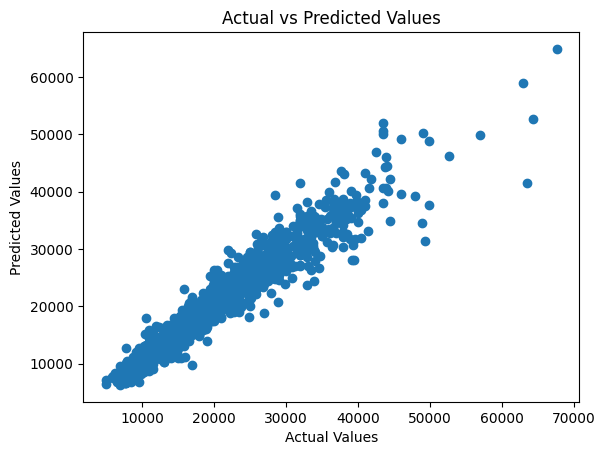

In [50]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

- This code will create a scatter plot showing the actual values on the x-axis and the residuals on the y-axis. The residuals are the differences between the actual values and the predicted values.

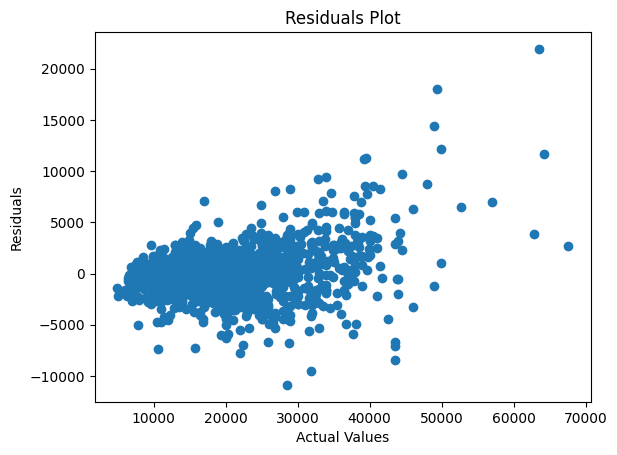

In [52]:
residuals = y_test - y_pred
plt.scatter(y_test, residuals)
plt.xlabel('Actual Values')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.show()